In [1]:
%matplotlib inline
import numpy as np # numerical computations
import pandas as pd # data manipulations
import matplotlib.pyplot as plt # Plots
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import preprocessing
from sklearn.linear_model import Ridge
from sklearn.linear_model import Lasso
import seaborn as sns; sns.set(color_codes=True) 
plt.style.use('seaborn-dark')

### $\texttt{1. Wine quality}$

A lot of portugese Vinho Verde wines (http://www.vinhoverde.pt/en/) have been chemically analized. They have also been rated by a panel of wine experts. 

The features comprise:
1- fixed acidity | 2 - volatile acidity | 3 - citric acid | 4 - residual sugar | 5 - chlorides | 6 - free sulfur dioxide | 7 - total sulfur dioxide | 8 - density | 9 - pH | 10 - sulphates |11 - alcohol

The target variable is the quality score

Apply regression to (as accurately as possible) predict the quality score of the wine from the chemical parameters.


In [2]:
# Reading the dataset
dataset = pd.read_csv('data/winequality-red.csv',delimiter = ';') # pandas dataframe

dataset.shape

(1599, 12)

This shows that our dataset has 1599 rows and 12 columns

In [3]:
# Show first rows of the dataset

'''
the pandas .head() function
shows the first 5 rows of our dataset
'''
dataset.head()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


### $\texttt{Statistical analysis}$

- Compute an overview of the main statistical parameters. Use the dataset.describe() function.
- Check for missing values
- Check for outliers
- Make a correlation heatmap and discuss the results
- Make a pairplot and discuss the results.


In [4]:
# Statistical description

'''
the .describe() pandas function shows:
count of all non-empty entries for the each column
average value per column
std - the standard deviation 
the min value for each column
25%, 50% and 75% percentiles
maximum value per column
'''

dataset.describe()

,fixed_acidity,volatile_acidity,citric_acid,residual_sugar,chlorides,free_sulfur_dioxide,total_sulfur_dioxide,density,pH,sulphates,alcohol,quality
count,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000,1599.000000
mean,8.319637,0.527821,0.270976,2.538806,0.087467,15.874922,46.467792,0.996747,3.311113,0.658149,10.422983,5.636023
std,1.741096,0.179060,0.194801,1.409928,0.047065,10.460157,32.895324,0.001887,0.154386,0.169507,1.065668,0.807569
min,4.600000,0.120000,0.000000,0.900000,0.012000,1.000000,6.000000,0.990070,2.740000,0.330000,8.400000,3.000000
25%,7.100000,0.390000,0.090000,1.900000,0.070000,7.000000,22.000000,0.995600,3.210000,0.550000,9.500000,5.000000
50%,7.900000,0.520000,0.260000,2.200000,0.079000,14.000000,38.000000,0.996750,3.310000,0.620000,10.200000,6.000000
75%,9.200000,0.640000,0.420000,2.600000,0.090000,21.000000,62.000000,0.997835,3.400000,0.730000,11.100000,6.000000
max,15.900000,1.580000,1.000000,15.500000,0.611000,72.000000,289.000000,1.003690,4.010000,2.000000,14.900000,8.000000


In [5]:
#Checking for missing values

dataset.isnull().values.any()


False

False, shows that there is no missing values in our dataset.

### $\texttt{Checking for outliers}$

I will use the seaborn's violin plots to visually inspect for outliers in our dataset. 

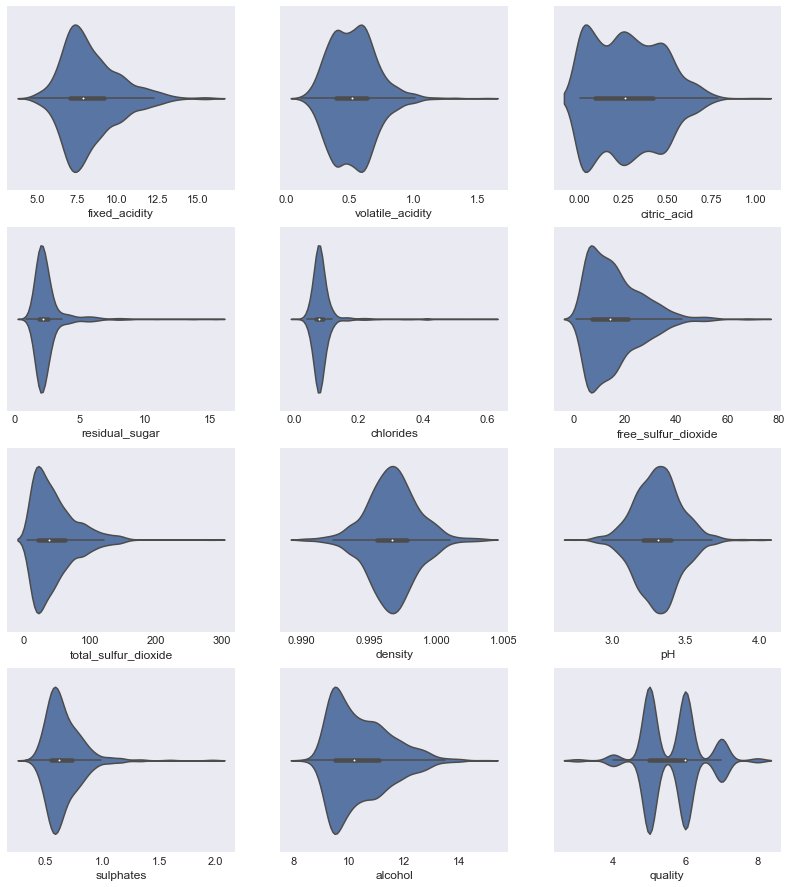

In [6]:
# Removing outliers

from scipy import stats
import numpy as np
import pylab as pl
import seaborn as sns

columns = dataset.columns.values  #getting all the columns in our dataset

fig, ax = pl.subplots(nrows=4, ncols=3, figsize=(10, 10))

for i in range(len(columns)):
    
    sns.violinplot(
                x=dataset[columns[i]], 
                    vert = False, 
                        ax=ax[i//3, i%3]
                )    
pl.subplots_adjust(right = 1.2, top= 1.3)




Our dataset obviously shows outliers. Outliers in a dataset can significantly affect the performance of machine learning models, as they have a noticeable impact on the standard deviation. They have been shown to impact the accuracy of machine learning, thus I will attempt to remove the outliers in the dataset.
 

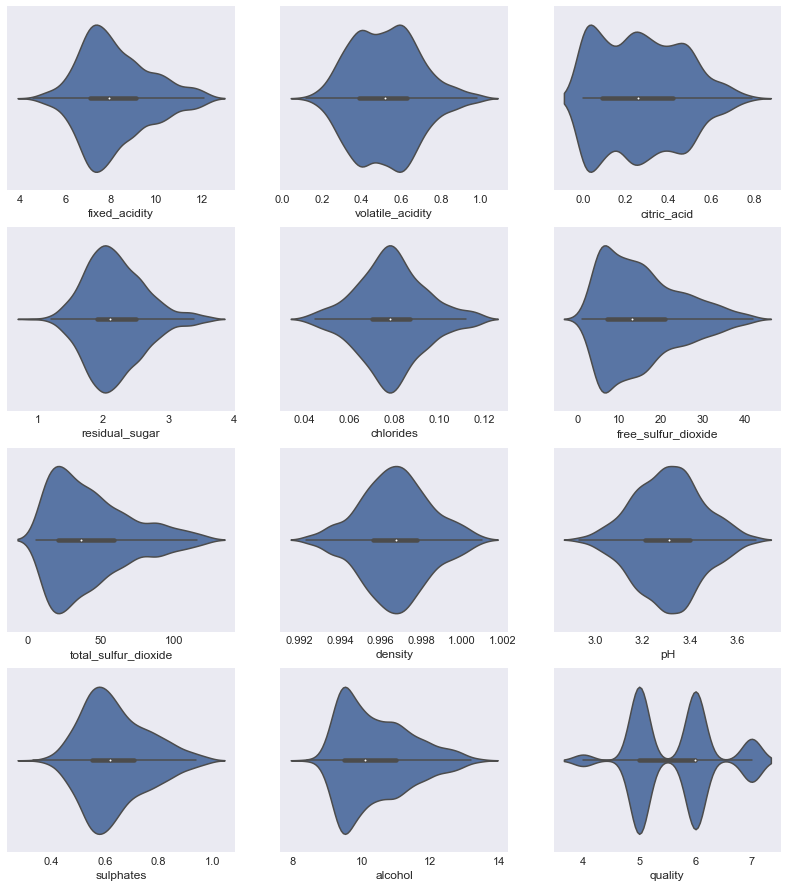

In [7]:
columns = dataset.columns.values

fig, ax = pl.subplots(
                nrows=4, 
                    ncols=3, 
                        figsize=(10, 10)
                )

for i in range(len(columns)):

    Q1 = dataset[columns[i]].quantile(0.25)   #calculating quartile 1 / 25th percentile
    Q3 = dataset[columns[i]].quantile(0.75)   #calculating quartile 3 / 75th percentile
    IQR = Q3 - Q1                             #calculating the interquartile range. 

    filter = (  
            dataset[columns[i]] >= Q1 - 1.5*IQR) \
                & \
                    (dataset[columns[i]] <= Q3 + 1.5*IQR)          
    
    '''
    the line above creates a filter for the dataset
    essentially I am filtering away all the values that 
    are less than Q1 - 1.5*IQR and values greater than
    Q3 + 1.5*IQR
    '''
    
    dataset.loc[filter]   # here we apply the filter to the our dataset and plot again below
    
    sns.violinplot(
            x=dataset.loc[filter][columns[i]],
                 vert = False, 
                    ax=ax[i//3, i%3]
            )
    
pl.subplots_adjust(right = 1.2, top= 1.3)

It's no surprise that the obvious outliers have been removed from the dataset now. 

In [8]:
dataset_filtered= dataset.loc[filter]  # going forward we will use the filtered dataset

dataset_filtered.shape     #a quicklook of how may rows have been affected


(1571, 12)

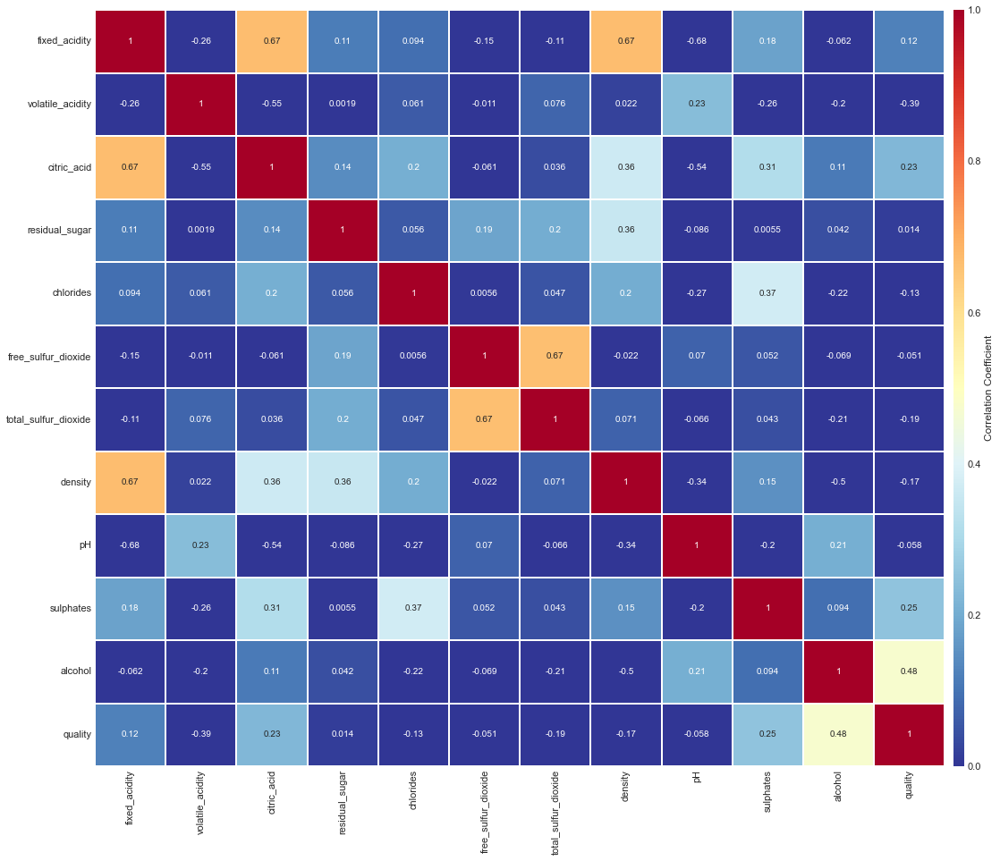

In [9]:
# Correlation heatmap

corr_map = dataset.corr()

pl.figure(
        figsize = (10, 10)
    )

heat_map = sns.heatmap(
        corr_map, 
            annot = True,
                 linewidths = .3, 
                     cmap = "RdYlBu_r",
                         vmin = 0,
                            cbar_kws={'shrink':1, 
                                      'pad':.01,
                                      'label':'Correlation Coefficient',
                                      'fraction':0.03,
                                      'aspect':70
                                     }
        )



pl.subplots_adjust(right = 1.5, top = 1.3)

pl.show()

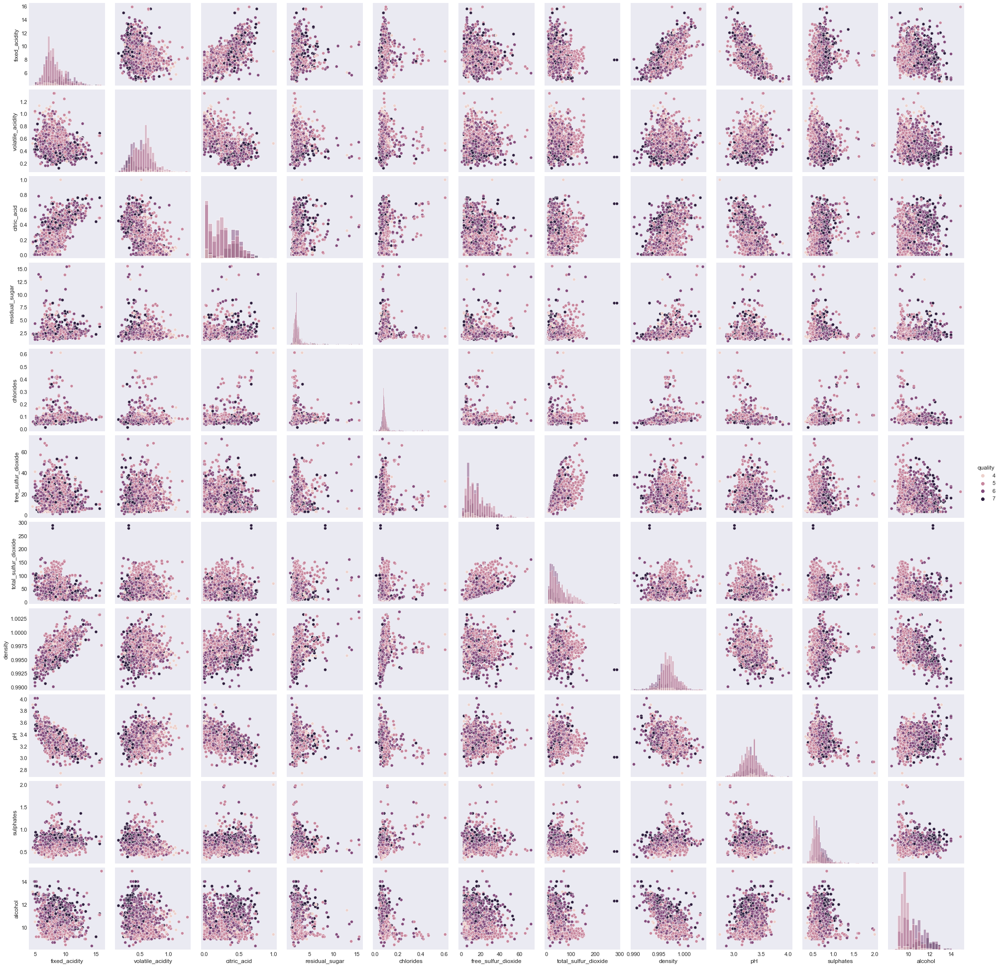

In [10]:
# Pairplot
sns.pairplot(
        dataset_filtered,
            hue='quality',
                diag_kind='hist'
        )

### $\texttt{Splitting into training and test set}$

In [11]:
# Split into features and targets.

target = dataset_filtered["quality"]

features = dataset_filtered.drop('quality', axis = 1)

In [12]:
# Split into training set and test set. Make sure that 30 percent
# of the wines end up in the test set.

x_train,\
      x_test,\
             y_train,\
                     y_test = train_test_split(
                                            features, 
                                                target,
                                                     test_size = 0.3,
                                                         random_state = 25
                                                )

### $\texttt{A quicklook of data distribution before scaling}$

This will help us know which scaling instance to invoke (MinMaxScaler, StandardScaler, etc.) to apply to our data as this can also be beneficial for the performance of the ML algorithm.

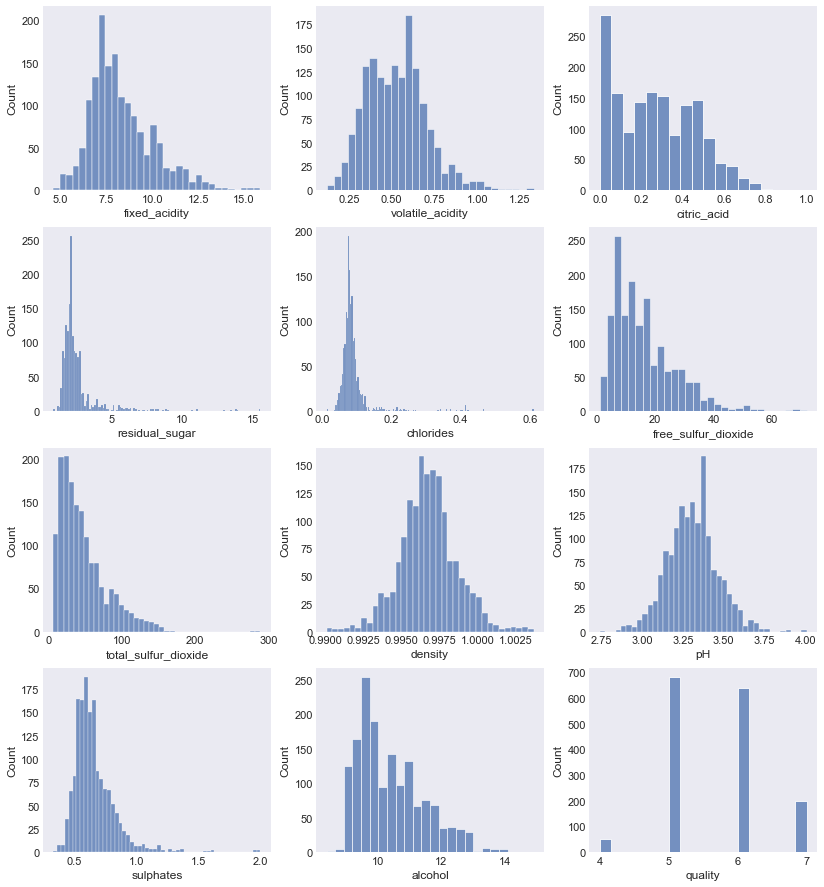

In [13]:
columns = dataset.columns.values  #getting all the columns in our dataset

fig, ax = pl.subplots(nrows=4, ncols=3, figsize=(10, 10))

for i in range(len(columns)):
    
    sns.histplot(
                x=dataset_filtered[columns[i]], 
                        ax=ax[i//3, i%3]
                )    
pl.subplots_adjust(right = 1.2, top= 1.3)

Our dataset looks more Gaussian distributed. For that reason I will apply a StandardScaler to scale my dataset.

### $\texttt{Scaling of the dataset}$

Scaling of datasets serves an important purpose of improving the accuracy of several ML algorithms. 

This is mainly because several machine learning algorithms are based on euclidean distances between the points. 

### $\texttt{using StandardScaler() for data scaling}$


In [14]:
# Scaling the training set and test set.

#instance of the StandardScaler

sc = StandardScaler()

xtrain_st_scaled = sc.fit_transform(x_train)      #scaling the training set

xtest_st_scaled = sc.transform(x_test)


### $\texttt{Training the regression model}$

In [15]:
# Training of the regression model

lg = LinearRegression()

reg = lg.fit(
            xtrain_st_scaled,
              y_train
            )                # training the regression model

pred = reg.predict(xtest_st_scaled)  # predictions

In [16]:
# Print and interpret the coëfficiënts and intercept of the model
print('Coefficients of the model =\n ', reg.coef_)

print('\n+++++++++++++++++++++++++++++++++++++++++++++\n')

print('Intercept of the model =\n ', reg.intercept_)

Coefficients of the model =
  [ 0.09629278 -0.15739708 -0.03823381 -0.00245759 -0.07787216  0.06277508
 -0.12226213 -0.02975038 -0.01907508  0.14770304  0.25585499]

+++++++++++++++++++++++++++++++++++++++++++++

Intercept of the model =
  5.634212920837124


### $\texttt{Testing and predicting}$
Predict the wine quality of a wine with the following chemical parameters:

fixed_acidity: 7.3 | 
volatile_acidity: 0.70 | citric_acid: 0.00 | residual_sugar: 1.9 | chlorides: 0.079 | free_sulfur_dioxide: 11.0 | total_sulfur_dioxide: 34.0 | density: 0.9978 | pH: 3.51 | sulphates: 0.58 | alcohol: 9.4

In [17]:
# Prediction of the quality

new_feature = {'fixed_acidity': [7.3], 'volatile_acidity': [0.70], 'citric_acid': [0.00], 'residual_sugar' : [1.9],\
                 'chlorides': [0.079], 'free_sulfur_dioxide' : [11.0], 'total_sulfur_dioxide': [34.0], 'density': [0.9978],\
                      'pH':[3.51], 'sulphates': [0.58], 'alcohol': [9.4]}

df_feature = pd.DataFrame(new_feature)

y = reg.predict(df_feature)

y

/Users/xola/anaconda3/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but LinearRegression was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


array([5.14383072])

The predicted value for the wine with the above chemical properties is 5.14, which, when rounded off to the nearest unit is 5.

In [18]:
# Evaluate the model in terms of MAE, MSE and R2-score on the test set
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error

# Evaluation of the model

mae = mean_absolute_error(y_test, pred)

print(f'the MAE of the model is {mae}\n')

r2score = r2_score(y_test, pred)

print(f'the R2-score for this model is {r2score}\n')

mse = mean_squared_error(y_test, pred)

print(f'the MSE for this model is {mse}\n')


the MAE of the model is 0.4554783809808202

the R2-score for this model is 0.3624862982336188

the MSE for this model is 0.3413175286011871



## $\texttt{Attempting Logistic Regression}$

In [19]:
from sklearn.linear_model import LogisticRegression

lg = LogisticRegression(
                multi_class='multinomial',
                    class_weight='balanced',
                        solver='newton-cg',
                            max_iter=1e3
                )

fitting = lg.fit(
            xtrain_st_scaled,
              y_train
            )                # training the regression model

pred = reg.predict(xtest_st_scaled)  # predictions


print('Coefficients of the model =\n ', fitting.coef_)

print('\n+++++++++++++++++++++++++++++++++++++++++++++\n')

print('Intercept of the model =\n ', fitting.intercept_)

Coefficients of the model =
  [[ 0.59121271  0.736072    0.3586292   0.45900351  0.4194301  -0.42893545
   0.1623614  -0.79131403  0.79244601 -0.2122354  -0.80265779]
 [-0.5216698   0.06147648 -0.03955461 -0.16323765  0.19855047 -0.08217187
   0.48305232  0.34402919 -0.32392867 -0.45653122 -0.50072053]
 [-0.35177456 -0.34835903 -0.22507283 -0.24336998 -0.09013515  0.19902503
  -0.03468465  0.39054618 -0.31406408  0.02720871  0.28081423]
 [ 0.28223165 -0.44918945 -0.09400177 -0.05239588 -0.52784542  0.3120823
  -0.61072907  0.05673865 -0.15445326  0.64155791  1.02256409]]

+++++++++++++++++++++++++++++++++++++++++++++

Intercept of the model =
  [-0.09091003  0.26232487  0.4718486  -0.64326345]


### $\texttt{Testing and predicting for LOGISTIC regression}$
Predict the wine quality of a wine with the following chemical parameters:

fixed_acidity: 7.3 | 
volatile_acidity: 0.70 | citric_acid: 0.00 | residual_sugar: 1.9 | chlorides: 0.079 | free_sulfur_dioxide: 11.0 | total_sulfur_dioxide: 34.0 | density: 0.9978 | pH: 3.51 | sulphates: 0.58 | alcohol: 9.4

In [20]:
# Prediction of the quality

new_feature = {'fixed_acidity': [7.3], 'volatile_acidity': [0.70], 'citric_acid': [0.00], 'residual_sugar' : [1.9],\
                 'chlorides': [0.079], 'free_sulfur_dioxide' : [11.0], 'total_sulfur_dioxide': [34.0], 'density': [0.9978],\
                      'pH':[3.51], 'sulphates': [0.58], 'alcohol': [9.4]}

df_feature = pd.DataFrame(new_feature)

y = fitting.predict(df_feature)

y

/Users/xola/anaconda3/lib/python3.7/site-packages/sklearn/base.py:444: UserWarning: X has feature names, but LogisticRegression was fitted without feature names
  f"X has feature names, but {self.__class__.__name__} was fitted without"


array([5])

The predicted value for the wine with the above chemical properties is 5, which, agrees with the Linear Regression model trained above.

Evaluate the model on the test set in terms of MAE, MSE and the $R^2$-score.

In [21]:
# Evaluate the model in terms of MAE, MSE and R2-score on the test set

# Evaluation of the model
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error, accuracy_score


mae = mean_absolute_error(y_test, pred)

print(f'the MAE of the model is {mae}\n')

r2score = r2_score(y_test, pred)

print(f'the R2-score for this model is {r2score}\n')

mse = mean_squared_error(y_test, pred)

print(f'the MSE for this model is {mse}\n')

the MAE of the model is 0.4554783809808202

the R2-score for this model is 0.3624862982336188

the MSE for this model is 0.3413175286011871



### $\texttt{Model optimization}$

Try to improve the performance of the model. In other words, try to improve the $R^2$-score of the model.
Possible options to improve the model performance are:
-  Adding higher-order features.
-  Think of new features that can be added to the dataset or computed from the existing features.
- Use Ridge regression and Lasso regression. Try to find a good value for alpha, the regularization parameter.
- Check for underfitting and overfitting.
- You can add higher-order features by means of the sklearn.preprocessing.PolynomialFeatures function. Don't go higher than a fourth-order polynomial.

In [22]:
# Model optimization and hyperparameter tuning.

from sklearn.preprocessing import PolynomialFeatures


# higher order features


degrees = [2, 3, 4] 

'''
I will try and compare all degrees in range(2, 5) 

'''

for i in range(len(degrees)):
    

    poly = PolynomialFeatures(degrees[i])

    xtrain_poly = poly.fit_transform(
                            xtrain_st_scaled
                        )       #applying polynomial feature on the training set 
    
    xtest_poly = poly.transform(
                            xtest_st_scaled
                        )       #applying polynomial feature on the test set
    
    lg = LinearRegression()      #linear regression instance
    
    lg.fit(
        xtrain_poly,
            y_train
        )                    #fitting the linear regression model
    
    ypredicted = lg.predict(xtest_poly)  
    
    print(f'    METRICS for polynomial of degree {degrees[i]}')
    
    print('+---------------------------------------+\n')
    
    mae = mean_absolute_error(y_test, ypredicted)

    print(f'the MAE of the model is {mae}\n')

    r2score = r2_score(y_test, ypredicted)

    print(f'the R2-score for this model is {r2score}\n')

    mse = mean_squared_error(y_test, ypredicted)

    print(f'the MSE for this model is {mse}\n\n\n')

    METRICS for polynomial of degree 2
+---------------------------------------+

the MAE of the model is 0.47355713280407424

the R2-score for this model is 0.26510320942180987

the MSE for this model is 0.39345531812430057



    METRICS for polynomial of degree 3
+---------------------------------------+

the MAE of the model is 0.6552662898590389

the R2-score for this model is -2.3362551527363933

the MSE for this model is 1.786192767872854



    METRICS for polynomial of degree 4
+---------------------------------------+

the MAE of the model is 14.116794854171408

the R2-score for this model is -19821.968677621397

the MSE for this model is 10612.990214701096





The R$^2$ score get worse with increasing polynomial degree. This shows that linear regression is performing badly with the exponential increase of the features in our dataset.

### $\texttt{Applying the Ridge regression model}$


Text(0, 0.5, 'R² Performance')

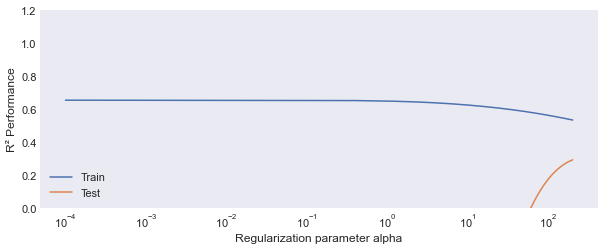

In [23]:
# R² as a function of alpha

train_r2 = []
test_r2 = []


poly = PolynomialFeatures(3)

xtrain_poly = poly.fit_transform(
                        xtrain_st_scaled
                    )       #applying polynomial feature on the training set 

xtest_poly = poly.fit_transform(
                        xtest_st_scaled
                    )       #applying polynomial feature on the test set

alphas = np.linspace(0.0001, 200, 500)

for alpha in alphas:
    lregmodel_poly = Ridge(alpha=alpha,tol=0.0001,fit_intercept=True)
    lregmodel_poly.fit(xtrain_poly, y_train)
    test_r2.append(lregmodel_poly.score(xtest_poly, y_test))  
    train_r2.append(lregmodel_poly.score(xtrain_poly, y_train))


# Plot r2
f, ax = plt.subplots(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.semilogx(alphas, train_r2, label='Train')
plt.semilogx(alphas, test_r2, label='Test')
plt.legend(loc='lower left')
plt.ylim([0, 1.2])
plt.xlabel('Regularization parameter alpha')
plt.ylabel('R² Performance')


### $\texttt{Applying the Lasso regression model}$


Text(0, 0.5, 'R² Performance')

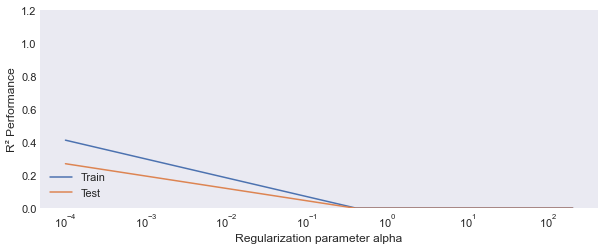

In [24]:
# R² as a function of alpha

train_r2 = []
test_r2 = []

'''
following the description above, we will use
ploynomial feature with degree 2, since it is the 
one with a better R2 score. thus ...
'''

poly = PolynomialFeatures(2)

xtrain_poly = poly.fit_transform(
                        xtrain_st_scaled
                    )       #applying polynomial feature on the training set 

xtest_poly = poly.fit_transform(
                        xtest_st_scaled
                    )       #applying polynomial feature on the test set

alphas = np.linspace(0.0001, 200, 500)

for alpha in alphas:
    lregmodel_poly = Lasso(alpha=alpha,max_iter=5000,tol=0.0001,fit_intercept=True)
    lregmodel_poly.fit(xtrain_poly, y_train)
    test_r2.append(lregmodel_poly.score(xtest_poly, y_test))  
    train_r2.append(lregmodel_poly.score(xtrain_poly, y_train))


# Plot r2
f, ax = plt.subplots(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.semilogx(alphas, train_r2, label='Train')
plt.semilogx(alphas, test_r2, label='Test')
plt.legend(loc='lower left')
plt.ylim([0, 1.2])
plt.xlabel('Regularization parameter alpha')
plt.ylabel('R² Performance')


# Set up matplotlib fig, and size it to fit 4x4 pics
fig = pl.gcf()
nrows = 8
ncols = 8
fig.set_size_inches(ncols * 4, nrows * 4)

pic_index = 8



for i, img_path in enumerate(alphas):
  # Set up subplot; subplot indices start at 1
    sp = pl.subplot(nrows, ncols, i + 1)
    
    


# $\texttt{2. Parkinson}$

Tracking Parkinson's disease symptom progression often uses the unified Parkinson's disease rating scale (UPDRS). But the tracking has to happen in the hospital by trained staff, which is very time-consuming for the patient and the hospital staff. 

In 2010 a data set was published [1] that was composed of a range of biomedical voice measurements from 42 people with early-stage Parkinson's disease recruited to a six-month trial of a telemonitoring device for remote symptom progression monitoring. The recordings were automatically captured in the patient's homes. 


> [1] A. Tsanas, M. A. Little, P. E. McSharry, L. O. Ramig (2010),
*Accurate telemonitoring of Parkinson's disease progression by non-invasive 
speech tests*,
IEEE Transactions on Biomedical Engineering;57(4):884-93.

Here you can find a overview of the features: 

|      feature      | Description | 
|------------|-----|
| age | Subject age. |
| sex | Subject gender '0' - male, '1' - female.|
| test_time | Time since recruitment into the trial. The integer part is the number of days since recruitment. |
| Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP | Several measures of variation in fundamental frequency. |
| Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA | Several measures of variation in amplitude. |
| NHR,HNR | Two measures of the ratio of noise to tonal components in the voice. |
| RPDE | A nonlinear dynamical complexity measure. |
| DFA | Signal fractal scaling exponent. |
| PPE | A nonlinear measure of fundamental frequency variation. |
| motor_UPDRS | Clinician's motor Unified Parkinson's Disease Rating Scale (UPDRS) score, linearly interpolated. (target)|

The goal is to use multiple linear regression to predict the motor_UPDRS as reliably as possible.

### $\texttt{Reading the dataset}$

In [25]:
# Read the dataset

dataset = pd.read_csv("data/parkinsons_updrs.csv")
dataset.head()

,age,sex,test_time,motor_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
0,72,0,5.6431,28.199,0.00662,0.000034,0.00401,0.00317,0.01204,0.02565,0.230,0.01438,0.01309,0.01662,0.04314,0.014290,21.640,0.41888,0.54842,0.16006
1,72,0,12.6660,28.447,0.00300,0.000017,0.00132,0.00150,0.00395,0.02024,0.179,0.00994,0.01072,0.01689,0.02982,0.011112,27.183,0.43493,0.56477,0.10810
2,72,0,19.6810,28.695,0.00481,0.000025,0.00205,0.00208,0.00616,0.01675,0.181,0.00734,0.00844,0.01458,0.02202,0.020220,23.047,0.46222,0.54405,0.21014
3,72,0,25.6470,28.905,0.00528,0.000027,0.00191,0.00264,0.00573,0.02309,0.327,0.01106,0.01265,0.01963,0.03317,0.027837,24.445,0.48730,0.57794,0.33277
4,72,0,33.6420,29.187,0.00335,0.000020,0.00093,0.00130,0.00278,0.01703,0.176,0.00679,0.00929,0.01819,0.02036,0.011625,26.126,0.47188,0.56122,0.19361


What's the shape of the dataset?


In [26]:
dataset.shape

(5875, 20)

### $\texttt{Statistical pre-analysis}$

- Provide a summary table with the describe function of pandas.
- Check whether the dataset contains missing values. If it does, delete the rows with missing values.
- Is there any outlier data at first glance? Although this is not completely true for multidimensional correlated data, in this task you can consider outliers as feature values that are more than 5 standard deviations from the mean.
- Create a heatmap. Which features seem to have the most influence on the motor_UDPS? Are there features that are strongly correlated with each other? If you were to omit 3 features, which would they be? Explain why. With this question, the explanation is important.
- Make a pairplot, look at it carefully and formulate some conclusions. Are there any connections between what you see on the pairplot and on the correlation heatmap?



In [27]:
# Statistical pre-analysis

dataset.describe()

,age,sex,test_time,motor_UPDRS,Jitter(%),Jitter(Abs),Jitter:RAP,Jitter:PPQ5,Jitter:DDP,Shimmer,Shimmer(dB),Shimmer:APQ3,Shimmer:APQ5,Shimmer:APQ11,Shimmer:DDA,NHR,HNR,RPDE,DFA,PPE
count,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000,5875.000000
mean,64.804936,0.317787,92.863722,21.296229,0.006154,0.000044,0.002987,0.003277,0.008962,0.034035,0.310960,0.017156,0.020144,0.027481,0.051467,0.032120,21.679495,0.541473,0.653240,0.219589
std,8.821524,0.465656,53.445602,8.129282,0.005624,0.000036,0.003124,0.003732,0.009371,0.025835,0.230254,0.013237,0.016664,0.019986,0.039711,0.059692,4.291096,0.100986,0.070902,0.091498
min,36.000000,0.000000,-4.262500,5.037700,0.000830,0.000002,0.000330,0.000430,0.000980,0.003060,0.026000,0.001610,0.001940,0.002490,0.004840,0.000286,1.659000,0.151020,0.514040,0.021983
25%,58.000000,0.000000,46.847500,15.000000,0.003580,0.000022,0.001580,0.001820,0.004730,0.019120,0.175000,0.009280,0.010790,0.015665,0.027830,0.010955,19.406000,0.469785,0.596180,0.156340
50%,65.000000,0.000000,91.523000,20.871000,0.004900,0.000035,0.002250,0.002490,0.006750,0.027510,0.253000,0.013700,0.015940,0.022710,0.041110,0.018448,21.920000,0.542250,0.643600,0.205500
75%,72.000000,1.000000,138.445000,27.596500,0.006800,0.000053,0.003290,0.003460,0.009870,0.039750,0.365000,0.020575,0.023755,0.032715,0.061735,0.031463,24.444000,0.614045,0.711335,0.264490
max,85.000000,1.000000,215.490000,39.511000,0.099990,0.000446,0.057540,0.069560,0.172630,0.268630,2.107000,0.162670,0.167020,0.275460,0.488020,0.748260,37.875000,0.966080,0.865600,0.731730


In [28]:
#checking for missing values

dataset.isnull().values.any()

False

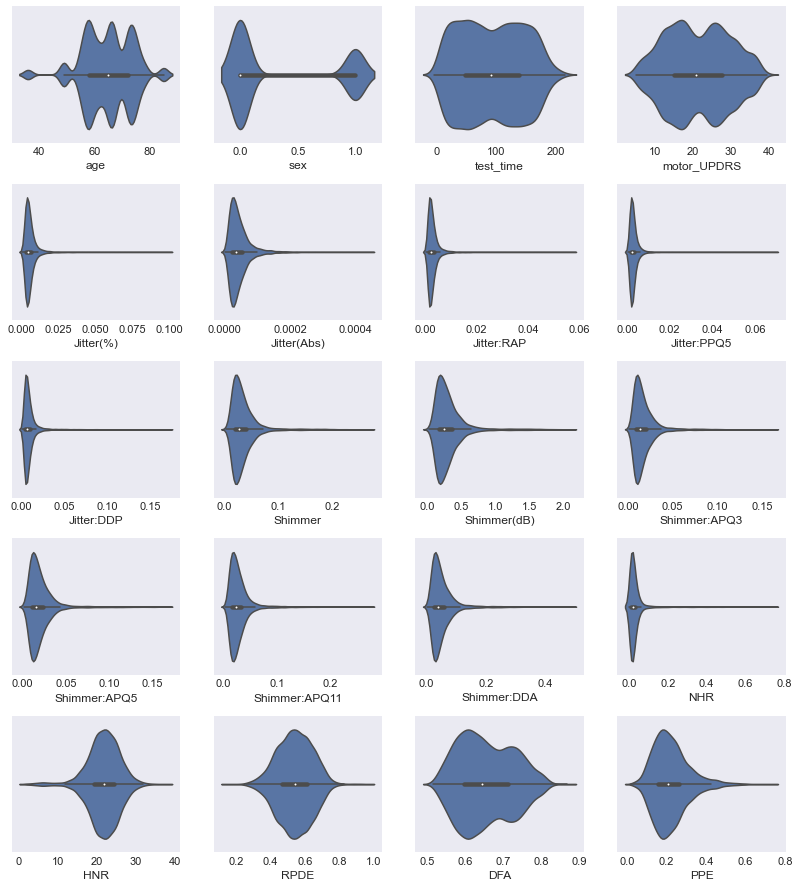

In [29]:
from scipy import stats
import numpy as np
import pylab as pl
import seaborn as sns

columns = dataset.columns.values  #getting all the columns in our dataset

fig, ax = pl.subplots(nrows=5, ncols=4, figsize=(10, 10))

for i in range(len(columns)):
    
    sns.violinplot(
                x=dataset[columns[i]], 
                    vert = False, 
                        ax=ax[i//4, i%4]
                )    
pl.subplots_adjust(right = 1.2, top= 1.3, hspace=.3)



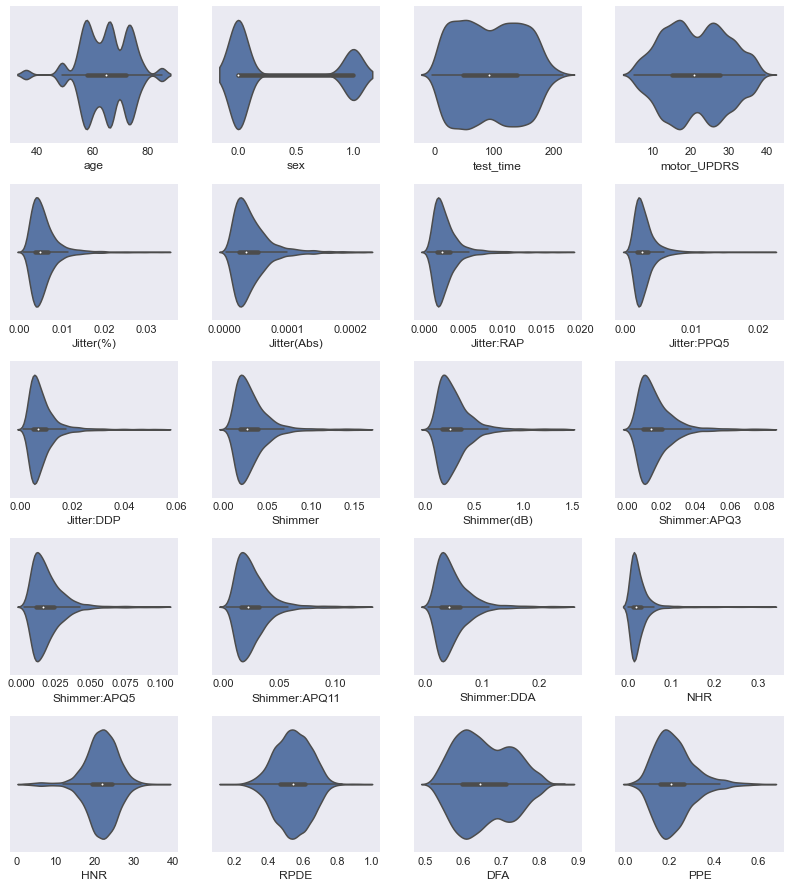

In [30]:
columns = dataset.columns.values

fig, ax = pl.subplots(
                nrows=5, 
                    ncols=4, 
                        figsize=(10, 10)
                )

df = dict()                #empty dictionary for filtered columns 

for i in range(len(columns)):

    mean = dataset[columns[i]].mean()     #computing the mean of each column
    std = dataset[columns[i]].std()       #computing the std of each column

    filter = (np.abs(dataset[columns[i]] - mean) < 5*std)   #filtering for values that are less than 5 std from the mean    
    
    
    dataset.loc[filter]   # here we apply the filter to the our dataset and plot again below
    
    small_dict = {
                columns[i]:dataset.loc[filter][columns[i]]
                }        #creating a dictionary to only keep the filtered columns 
    
    df.update(small_dict)         

    
    sns.violinplot(
            x = dataset.loc[filter][columns[i]],
                 vert = False, 
                    ax=ax[i//4, i%4]
            )    
pl.subplots_adjust(right = 1.2, top= 1.3, hspace=.3)


In [31]:
df = pd.DataFrame(df)

### $\texttt{Dealing with missing values}$


I have truncated all the columns of my dataset to exclude outliers, values $>$ 5$\sigma$. However, it is no surprice that I have induced inconsistency in the columns. Thus, I will apply a simple methon of dealing with the missing values in my new dataframe.

The cell of code below gives a number count of missing values per column. 

Phew, the target column is not affected.

In [32]:
df.isnull().sum()

age               0
sex               0
test_time         0
motor_UPDRS       0
Jitter(%)        49
Jitter(Abs)      30
Jitter:RAP       40
Jitter:PPQ5      55
Jitter:DDP       40
Shimmer          55
Shimmer(dB)      53
Shimmer:APQ3     42
Shimmer:APQ5     58
Shimmer:APQ11    40
Shimmer:DDA      42
NHR              67
HNR               0
RPDE              0
DFA               0
PPE               4
dtype: int64

### $\texttt{Deleting the missing values}$

In [42]:
new_df = df.dropna()  #naming it a new dataframe

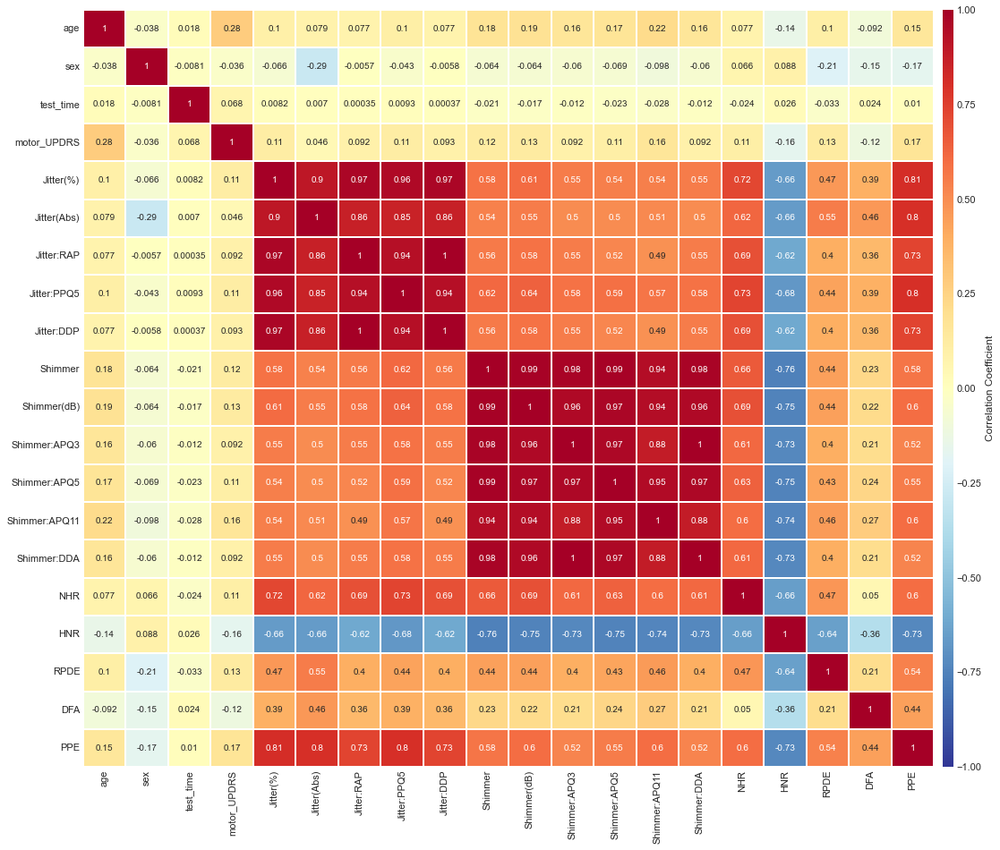

In [45]:
#Correlation heatmap

corr_map = new_df.corr()

pl.figure(
        figsize = (10, 10)
    )

heat_map = sns.heatmap(
        corr_map, 
            annot = True,
                 linewidths = .3, 
                     cmap = "RdYlBu_r",
                         vmin = -1,
                            cbar_kws={'shrink':1, 
                                      'pad':.01,
                                      'label':'Correlation Coefficient',
                                      'fraction':0.03,
                                      'aspect':70
                                     }
        )



pl.subplots_adjust(right = 1.5, top = 1.3)

pl.show()

### $\texttt{Analysis of the heatmap}$


* The correlation heatmap provides a quantity measuring the linear relationship between two variables for all variable. 



* The correlation value ranges between -1 and 1, which are considered negatively and positively correlated, respectively.



* Each block in the map is a correlation measure of two variables, and each of these blocks are colored by the correlation measure provided in the colorbar.



* The red blocks show a strong positive correlation, while the more bluer blocks show a somewhat strong negative correltion. The yellowish color shows no relationship between two variable.

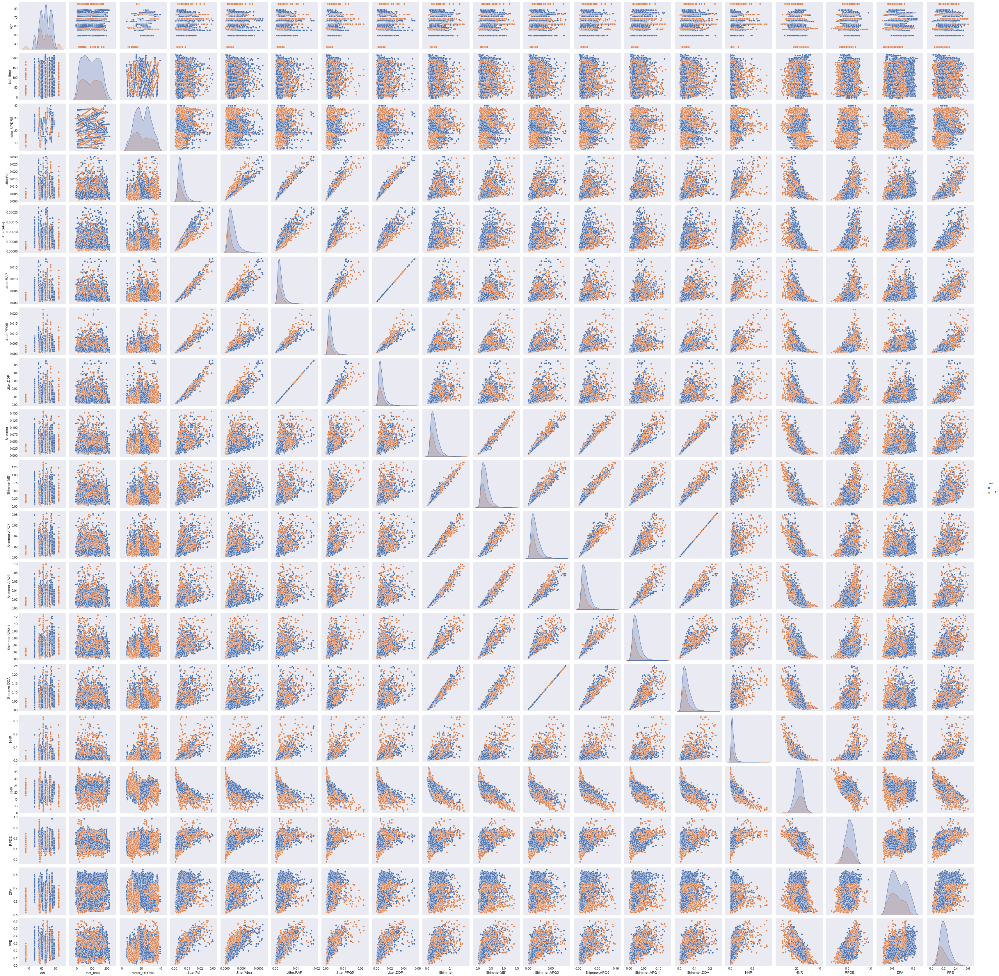

In [47]:
# Pairplot
sns.pairplot(
        new_df,
            hue='sex'
        )

### $\texttt{Analysis of the pairplot}$

* The pairplot is more a visual representation of the correlation heatmap.

* The above pairplot is colored by the column 'sex' in our dataset and it shows how two variables relate. 

* Tight relations signify that two variables are strongly correlated, and the slope of the relation shows tells us if it is a positive or a negative relation.


### $\texttt{Data imputation}$


Before I split up the dataset I will apply the data imputation for the missing values our new, truncated dataset. To try and keep the dataset normally distributed I will populate the missing values with $\bar{x}$, which is the mean in each column.

from sklearn.impute import SimpleImputer

columns = df.columns.values


imp = SimpleImputer(
                missing_values=np.nan,
                    strategy='median' 
                )

df_imputed = imp.fit_transform(df)

df_imputed = pd.DataFrame(df_imputed, columns=columns)


### $\texttt{Splitting up the dataset}$

Split the dataset into features X and targets y. Then you can split the dataset into a training set and a test set. Use the function train_test_split from Sklearn (http://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html). Make sure that 20 percent of the dataset ends up in the test set.

Visualise your features with a boxplot, are there any features present that are on a completly different scale, does this dataset need to be normalised?
Scale/normalise the training set and the test set with a standards scaler. Try later also with a robustscaler.
Explain what the difference is between the standardscaler and the robustscaler.
The labels do not need to be scaled or normalized.

# $\texttt{Splitting into target and features}$

target = df_imputed['motor_UPDRS']

features = df_imputed.drop('motor_UPDRS', axis=1)

features.shape

In [48]:
# splitting into target and features

target = new_df['motor_UPDRS']

features = new_df.drop('motor_UPDRS', axis=1)

features.shape

(5761, 19)

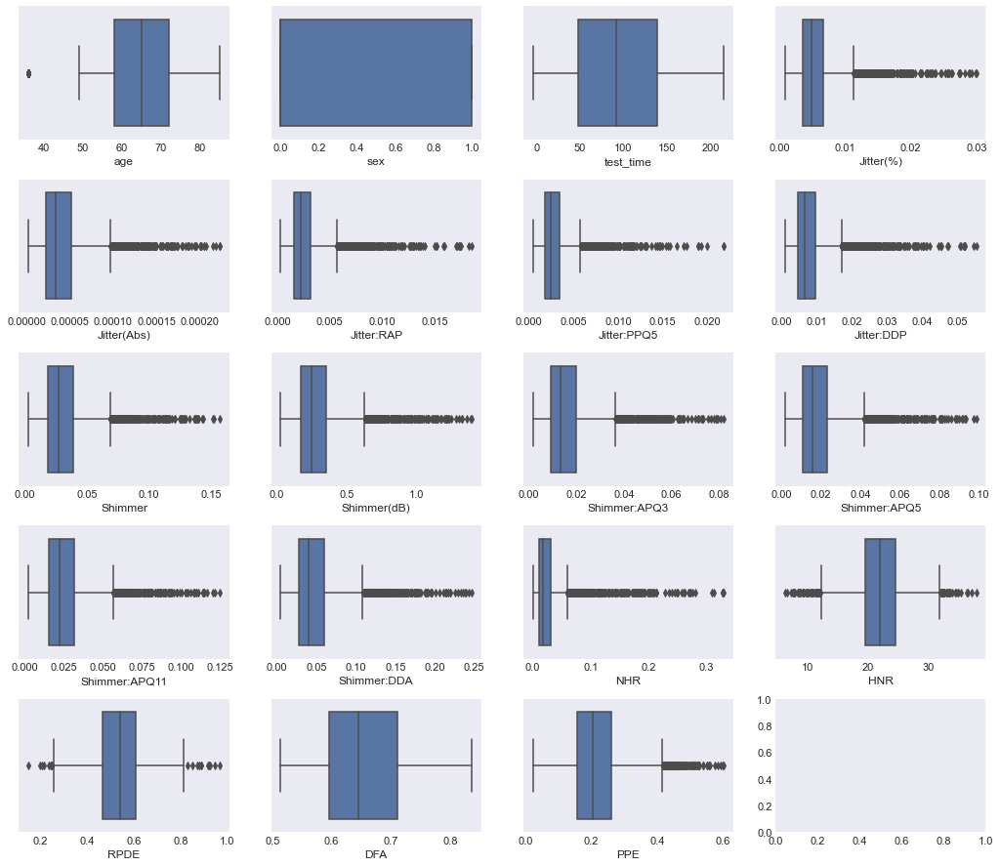

In [49]:
# Visualise your features with a boxplot


columns = features.columns.values

fig, ax = pl.subplots(
                nrows=5, 
                    ncols=4, 
                        figsize=(10, 10)
                )

for i in range(len(columns)):
    
    sns.boxplot(
            x=features[columns[i]],
                    ax=ax[i//4, i%4]
            )
    
pl.subplots_adjust(right = 1.5, top= 1.3, hspace=.3)

In [50]:
# Splitting the dataset into a train- and testset


xtrain,\
    xtest,\
        ytrain, \
            ytest = train_test_split(
                                features,
                                    target,
                                        test_size=0.2,
                                            random_state=45
                                )

In [51]:
# Scaling the data

#instance of the StandardScaler

sc = StandardScaler()

xtrain_scaled = sc.fit_transform(xtrain)      #scaling the training set

xtest_scaled = sc.transform(xtest)


### $\texttt{Training the regression model}$

Train a regression model via linear_model.LinearRegression(). Then print and interpret the model coefficients. 

In [52]:
# Training the regression model

lg = LinearRegression()

reg = lg.fit(
        xtrain_scaled,
        ytrain
)


yhat = reg.predict(xtest_scaled)



print('Coefficients of the model =\n ', reg.coef_)

print('\n+++++++++++++++++++++++++++++++++++++++++++++\n')

print('Intercept of the model =\n ', reg.intercept_)


Coefficients of the model =
  [   1.57502531   -0.97870573    0.6274943     2.45945125   -4.31861083
  -75.44843056   -0.47928533   77.11593388    5.4215859    -1.40133013
  110.30877614   -2.67614635    2.23678508 -114.17374326   -0.98393297
   -1.71706535    0.27022943   -1.72492818    1.44937005]

+++++++++++++++++++++++++++++++++++++++++++++

Intercept of the model =
  21.178882335069417


In [53]:
# Evaluation of the model
from sklearn.metrics import mean_absolute_error, r2_score, mean_squared_error


mae = mean_absolute_error(ytest, yhat)

print(f'the MAE of the model is {mae}\n')

r2score = r2_score(ytest, yhat)

print(f'the R2-score for this model is {r2score}\n')

mse = mean_squared_error(ytest, yhat)

print(f'the MSE for this model is {mse}\n')

the MAE of the model is 6.230946950210458

the R2-score for this model is 0.1661093357281348

the MSE for this model is 54.15660046075911



### $\texttt{Model optimization}$
Try to improve the performance of the model. In other words, lower the MAE and the MSE and increase the $R^2$ score.
Possible options are:
- Adding higher order features (manually). Justify why you would use certain higher order features. Look for example at the pairplot or the correlation heatmap (look for non-linearities).
- Derive additional features from existing features.
- Apply regularisation via Ridge regression and Lasso regression. Always look for a good value for alpha. 
- Always check if there is overfitting or underfitting. Do this by comparing the performance on the training set with the performance on the test set. 
- Add higher order features automatically via sklearn.preprocessing.PolynomialFeatures. Do not go higher than 3rd order. The number of features increases exponentially with the order, with the result that the model can no longer be trained within an acceptable time.

Always motivate the made decisions and evaluate the model with the test set. What is the best performance you can achieve? **Discuss the final result**.

In [54]:
# Model optimization

from sklearn.preprocessing import PolynomialFeatures

# higher order features

degrees = [2, 3] 

'''
I will try and compare all degrees in range(2, 4) 

'''

for i in range(len(degrees)):
    

    poly = PolynomialFeatures(degrees[i])

    xtrain_poly = poly.fit_transform(
                            xtrain_scaled
                        )       #applying polynomial feature on the training set 
    
    xtest_poly = poly.transform(
                            xtest_scaled
                        )       #applying polynomial feature on the test set
    
    lg = LinearRegression()      #linear regression instance
    
    lg.fit(
        xtrain_poly,
            ytrain
        )                    #fitting the linear regression model
    
    yhat = lg.predict(xtest_poly)  
    
    print(f'METRICS for polynomial of degree {degrees[i]}\n')
    
    print('----------------------------------------------------\n')
    
    mae = mean_absolute_error(ytest, yhat)

    print(f'the MAE of the model is {mae}\n')

    r2score = r2_score(ytest, yhat)

    print(f'the R2-score for this model is {r2score}\n')

    mse = mean_squared_error(ytest, yhat)

    print(f'the MSE for this model is {mse}\n\n')


METRICS for polynomial of degree 2

----------------------------------------------------

the MAE of the model is 5.558126965014416

the R2-score for this model is 0.27664946971725124

the MSE for this model is 46.97762829112268


METRICS for polynomial of degree 3

----------------------------------------------------

the MAE of the model is 7.78149065202182

the R2-score for this model is -7.842632828555519

the MSE for this model is 574.2802427647117




### $\texttt{Applying Ridge regression}$

Text(0, 0.5, 'R² Performance')

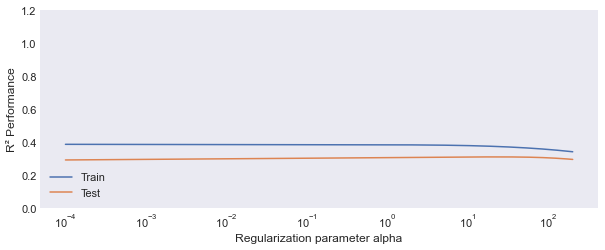

In [55]:
#R² as a function of alpha

train_r2 = []
test_r2 = []


poly = PolynomialFeatures(2)

xtrain_poly = poly.fit_transform(
                        xtrain_scaled
                    )       #applying polynomial feature on the training set 

xtest_poly = poly.transform(
                        xtest_scaled
                    )       #applying polynomial feature on the test set

alphas = np.linspace(0.0001, 200, 500)

for alpha in alphas:
    lregmodel_poly = Ridge(alpha=alpha,tol=0.0001,fit_intercept=True)
    lregmodel_poly.fit(xtrain_poly, ytrain)
    test_r2.append(lregmodel_poly.score(xtest_poly, ytest))  
    train_r2.append(lregmodel_poly.score(xtrain_poly, ytrain))


# Plot r2
f, ax = plt.subplots(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.semilogx(alphas, train_r2, label='Train')
plt.semilogx(alphas, test_r2, label='Test')
plt.legend(loc='lower left')
plt.ylim([0, 1.2])
plt.xlabel('Regularization parameter alpha')
plt.ylabel('R² Performance')


### $\texttt{Applying Lasso regression}$

/Users/xola/anaconda3/lib/python3.7/site-packages/sklearn/linear_model/_coordinate_descent.py:648: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 9.321e+04, tolerance: 3.111e+01
  coef_, l1_reg, l2_reg, X, y, max_iter, tol, rng, random, positive


Text(0, 0.5, 'R² Performance')

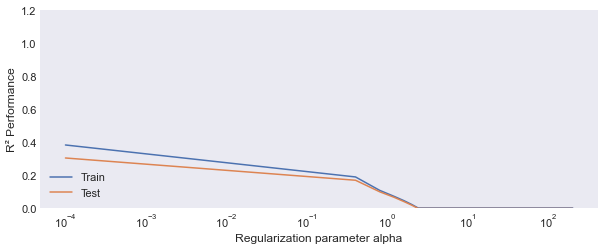

In [56]:
# R² as a function of alpha

train_r2 = []
test_r2 = []


poly = PolynomialFeatures(2)

xtrain_poly = poly.fit_transform(
                        xtrain_scaled
                    )       #applying polynomial feature on the training set 

xtest_poly = poly.transform(
                        xtest_scaled
                    )       #applying polynomial feature on the test set

alphas = np.linspace(0.0001, 200, 500)

for alpha in alphas:
    lregmodel_poly = Lasso(alpha=alpha, max_iter=5000, tol=0.0001, fit_intercept=True)
    lregmodel_poly.fit(xtrain_poly, ytrain)
    test_r2.append(lregmodel_poly.score(xtest_poly, ytest))  
    train_r2.append(lregmodel_poly.score(xtrain_poly, ytrain))


# Plot r2
f, ax = plt.subplots(figsize=(10, 8))
plt.subplot(2, 1, 1)
plt.semilogx(alphas, train_r2, label='Train')
plt.semilogx(alphas, test_r2, label='Test')
plt.legend(loc='lower left')
plt.ylim([0, 1.2])
plt.xlabel('Regularization parameter alpha')
plt.ylabel('R² Performance')


## 2. Lego


In the *lego.csv* file, you can find data about sold Lego sets.
Train a regressionmodel predict the price of new lego sets as accurately as possible.

Description of the dataset variables:

|      feature      | Description | 
|------------|-----|
| ages | age category for whom it is intended |
| list_price | selling price |
| num_reviews | number of reviews   |
| piece_count | number of pieces in this lego set |
| play_star_rating | Playstar rating |
| prod_id | id of the lego set|
| review_difficulty | difficulty level |
| val_star_rating | value for money rating|
| country | in which country it was sold |

The target variable is **'list_price'**

Predict the price of the following Lego set:
age category: 16+, 108 reviews, piece count: 4784 pieces, play_star_rating: 4.3, prod_id: 75252, review_difficulty: 3.8, val_star_rating: 3.4, sold in Belgium


In [57]:
# Code

dataset = pd.read_csv('data/lego.csv')


dataset.shape

(12261, 10)

In [58]:
#a quicklook of the dataset

dataset.head()

,ages,list_price,num_reviews,piece_count,play_star_rating,prod_id,review_difficulty,theme_name,val_star_rating,country
0,6-12,29.99,2.0,277.0,4.0,75823.0,Average,Angry Birds™,4.0,US
1,6-12,19.99,2.0,168.0,4.0,75822.0,Easy,Angry Birds™,4.0,US
2,6-12,12.99,11.0,74.0,4.3,75821.0,Easy,Angry Birds™,4.1,US
3,12+,99.99,23.0,1032.0,3.6,21030.0,Average,Architecture,4.3,US
4,12+,79.99,14.0,744.0,3.2,21035.0,Challenging,Architecture,4.1,US


In [59]:
#statistical analysis

dataset.describe()

,list_price,num_reviews,piece_count,play_star_rating,prod_id,val_star_rating
count,12261.000000,10641.000000,12261.000000,10486.000000,1.226100e+04,10466.000000
mean,65.141998,16.826238,493.405921,4.337641,5.983675e+04,4.228960
std,91.980429,36.368984,825.364580,0.652051,1.638115e+05,0.660282
min,2.272400,1.000000,1.000000,1.000000,6.300000e+02,1.000000
25%,19.990000,2.000000,97.000000,4.000000,2.103400e+04,4.000000
50%,36.587800,6.000000,216.000000,4.500000,4.206900e+04,4.300000
75%,70.192200,13.000000,544.000000,4.800000,7.092200e+04,4.700000
max,1104.870000,367.000000,7541.000000,5.000000,2.000431e+06,5.000000


In [60]:
#checking for missing data

dataset.isnull().sum()

ages                    0
list_price              0
num_reviews          1620
piece_count             0
play_star_rating     1775
prod_id                 0
review_difficulty    2055
theme_name              3
val_star_rating      1795
country                 0
dtype: int64

There is missing values in our datasets, I will first take care of this. For this I will use sklearn's imputation function. Since we also have categorical variables in our data, we will use the most occuring value in each column.

In [61]:
from sklearn.impute import SimpleImputer

columns = dataset.columns.values


imp = SimpleImputer(
                missing_values=np.nan,
                    strategy='most_frequent' 
                )

df_imputed = imp.fit_transform(dataset)

df_imputed = pd.DataFrame(df_imputed, columns=columns)

df_imputed.isnull().sum()

ages                 0
list_price           0
num_reviews          0
piece_count          0
play_star_rating     0
prod_id              0
review_difficulty    0
theme_name           0
val_star_rating      0
country              0
dtype: int64

In [62]:
df_imputed.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12261 entries, 0 to 12260
Data columns (total 10 columns):
 #   Column             Non-Null Count  Dtype 
---  ------             --------------  ----- 
 0   ages               12261 non-null  object
 1   list_price         12261 non-null  object
 2   num_reviews        12261 non-null  object
 3   piece_count        12261 non-null  object
 4   play_star_rating   12261 non-null  object
 5   prod_id            12261 non-null  object
 6   review_difficulty  12261 non-null  object
 7   theme_name         12261 non-null  object
 8   val_star_rating    12261 non-null  object
 9   country            12261 non-null  object
dtypes: object(10)
memory usage: 958.0+ KB


We will filter the columns that are objects are encode them to have numeric values

In [63]:
from sklearn.preprocessing import LabelEncoder

number = LabelEncoder()
objects = [x for x in df_imputed.columns if df_imputed[x].dtype == object]

for i in range(len(objects)):
    df_imputed[objects[i]] = number.fit_transform(df_imputed[objects[i]])

In [64]:
df_imputed

,ages,list_price,num_reviews,piece_count,play_star_rating,prod_id,review_difficulty,theme_name,val_star_rating,country
0,19,194,1,199,19,669,0,0,22,20
1,19,132,1,128,19,668,2,0,22,20
2,19,85,10,53,22,667,2,0,23,20
3,5,388,22,381,15,151,0,1,25,20
4,5,341,13,342,11,155,1,1,23,20
...,...,...,...,...,...,...,...,...,...,...
12256,23,225,5,228,23,477,2,38,24,19
12257,23,163,7,167,20,492,2,38,23,19
12258,23,163,17,177,25,475,2,38,27,19
12259,20,77,0,32,29,491,4,38,32,19


We check again if we have not missed anything

In [65]:
df_imputed.isnull().sum()

ages                 0
list_price           0
num_reviews          0
piece_count          0
play_star_rating     0
prod_id              0
review_difficulty    0
theme_name           0
val_star_rating      0
country              0
dtype: int64

Looks like I've gotten myself all-numeric data. Yay!!

Next up, is checking for outliers

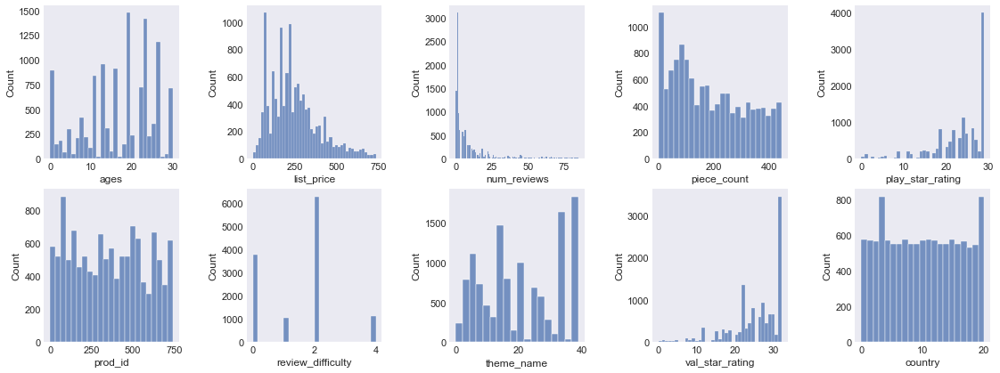

In [66]:

columns = df_imputed.columns.values  #getting all the columns in our dataset

fig, ax = pl.subplots(nrows=2, ncols=5, figsize=(10, 10))

for i in range(len(columns)):
    
    sns.histplot(
                x = df_imputed[columns[i]], 
                        ax=ax[i//5, i%5]
                )    
pl.subplots_adjust(right = 1.6, top= .65, hspace=.2, wspace=.5)

So here, it'd be tricky to check for outliers because I've done a lot of revamping to our dataset. I will train the regression model with this data as is.

In [67]:
# targets and features

target = df_imputed['list_price']

features = df_imputed.drop('list_price', axis=1)

In [68]:
#split split split


xtrain,\
    xtest,\
        ytrain,\
            ytest = train_test_split(
                            features, 
                                target, 
                                    test_size=.40, 
                                        random_state=45
                            )



In [69]:
#scaling scaling scaling


sc = StandardScaler()

xtrain_scaled = sc.fit_transform(xtrain)

xtest_scaled = sc.transform(xtest)



In [73]:
#train train train


lg = LinearRegression()


reg = lg.fit(xtrain_scaled, ytrain)

yhat = reg.predict(xtest_scaled)

In [74]:
#metrics

mae = mean_absolute_error(ytest, yhat)

print(f'the MAE of the model is {mae}\n')

r2score = r2_score(ytest, yhat)

print(f'the R2-score for this model is {r2score}\n')

mse = mean_squared_error(ytest, yhat)

print(f'the MSE for this model is {mse}\n')

the MAE of the model is 55.22521101649816

the R2-score for this model is 0.763484435129369

the MSE for this model is 5132.249950000683

